In [57]:
import surprise

In [1]:
import numpy as np 
import pandas as pd 
import surprise
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
        
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from ast import literal_eval
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import wordnet
from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

pd.options.display.max_columns=None
#pd.set_option('display.max_colwidth', None)

import warnings; warnings.simplefilter('ignore')


In [71]:
links_small = pd.read_csv('archive_3\links_small.csv')

In [72]:
links_small.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9125 entries, 0 to 9124
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  9125 non-null   int64  
 1   imdbId   9125 non-null   int64  
 2   tmdbId   9112 non-null   float64
dtypes: float64(1), int64(2)
memory usage: 214.0 KB


In [73]:
links_small.isnull().sum()

movieId     0
imdbId      0
tmdbId     13
dtype: int64

In [74]:
# only keeping not null the "tmsId" feature. and converting its type to int 
links_small = links_small[links_small['tmdbId'].notnull()]['tmdbId'].astype('int')

In [75]:
links_small.isnull().sum()

0

In [76]:
links_small.shape


(9112,)

In [77]:
links_small.head()

0      862
1     8844
2    15602
3    31357
4    11862
Name: tmdbId, dtype: int32

In [78]:
meta = pd. read_csv('archive_3\movies_metadata.csv')
meta.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.9469,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.0155,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.85949,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.38752,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [79]:
# Let's identify the total number of null values in the data:
meta.isnull().sum()

adult                        0
belongs_to_collection    40972
budget                       0
genres                       0
homepage                 37684
id                           0
imdb_id                     17
original_language           11
original_title               0
overview                   954
popularity                   5
poster_path                386
production_companies         3
production_countries         3
release_date                87
revenue                      6
runtime                    263
spoken_languages             6
status                      87
tagline                  25054
title                        6
video                        6
vote_average                 6
vote_count                   6
dtype: int64

In [80]:
meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45466 non-null  object 
 1   belongs_to_collection  4494 non-null   object 
 2   budget                 45466 non-null  object 
 3   genres                 45466 non-null  object 
 4   homepage               7782 non-null   object 
 5   id                     45466 non-null  object 
 6   imdb_id                45449 non-null  object 
 7   original_language      45455 non-null  object 
 8   original_title         45466 non-null  object 
 9   overview               44512 non-null  object 
 10  popularity             45461 non-null  object 
 11  poster_path            45080 non-null  object 
 12  production_companies   45463 non-null  object 
 13  production_countries   45463 non-null  object 
 14  release_date           45379 non-null  object 
 15  re

the dataset has sufficient number of null values. Also, we observe some of the columns have a list of dictionary structure- but it isn't a very easy format to read. So let's just clean it up to create an ordinary list.

literal_eval() to safely evaluate an expression. Call ast. literal_eval(source) with source as a string or node containing an expression to evaluate the expression. The parameter source is restricted to the following Python literal structures: strings, numbers, tuples, lists, dicts, booleans, and None.

In [81]:
meta['genres'] = meta['genres'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
#meta['production_companies']= meta['production_companies'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
#meta['production_countries'] = meta['production_countries'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
#meta['spoken_languages'] = meta['spoken_languages'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
#meta['year'] = pd.to_datetime(meta['release_date'], errors='coerce').apply(lambda x: str(x).split('-')[0] if x != np.nan else np.nan)

In [82]:
meta.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[Animation, Comedy, Family]",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.9469,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[Adventure, Fantasy, Family]",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.0155,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[Romance, Comedy]",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[Comedy, Drama, Romance]",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.85949,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,[Comedy],NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.38752,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [83]:
# Deleting the unwanted input rows. These rows required special treatments of processing, 
# and also protrayed lower weighted scores- hence would not have been a part of the recommendations- 
# So we can safely remove them
meta = meta.drop([19730, 29503, 35587])

In [84]:
meta['id'] = meta['id'].astype('int')

In [85]:
smd.isnull().sum()

adult                       0
belongs_to_collection    7531
budget                      0
genres                      0
homepage                 7218
id                          0
imdb_id                     0
original_language           0
original_title              0
overview                   12
popularity                  0
poster_path                 3
production_companies        0
production_countries        0
release_date                0
revenue                     0
runtime                     0
spoken_languages            0
status                      2
tagline                  2137
title                       0
video                       0
vote_average                0
vote_count                  0
year                        0
cast                        0
crew                        0
keywords                    0
dtype: int64

In [86]:
# Load keywords and credits
credits = pd.read_csv('archive_3\credits.csv')
keywords = pd.read_csv('archive_3\keywords.csv')

In [87]:
keywords.head()

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."


In [88]:
keywords.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46419 entries, 0 to 46418
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        46419 non-null  int64 
 1   keywords  46419 non-null  object
dtypes: int64(1), object(1)
memory usage: 725.4+ KB


In [89]:
credits.head()

,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844
2,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602
3,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357
4,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862


In [90]:
meta.genres.isnull().sum()

0

In [91]:
credits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45476 entries, 0 to 45475
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   cast    45476 non-null  object
 1   crew    45476 non-null  object
 2   id      45476 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.0+ MB


In [92]:
meta.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45463 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45463 non-null  object 
 1   belongs_to_collection  4491 non-null   object 
 2   budget                 45463 non-null  object 
 3   genres                 45463 non-null  object 
 4   homepage               7779 non-null   object 
 5   id                     45463 non-null  int32  
 6   imdb_id                45446 non-null  object 
 7   original_language      45452 non-null  object 
 8   original_title         45463 non-null  object 
 9   overview               44509 non-null  object 
 10  popularity             45460 non-null  object 
 11  poster_path            45077 non-null  object 
 12  production_companies   45460 non-null  object 
 13  production_countries   45460 non-null  object 
 14  release_date           45376 non-null  object 
 15  re

In [93]:
meta.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45463 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45463 non-null  object 
 1   belongs_to_collection  4491 non-null   object 
 2   budget                 45463 non-null  object 
 3   genres                 45463 non-null  object 
 4   homepage               7779 non-null   object 
 5   id                     45463 non-null  int32  
 6   imdb_id                45446 non-null  object 
 7   original_language      45452 non-null  object 
 8   original_title         45463 non-null  object 
 9   overview               44509 non-null  object 
 10  popularity             45460 non-null  object 
 11  poster_path            45077 non-null  object 
 12  production_companies   45460 non-null  object 
 13  production_countries   45460 non-null  object 
 14  release_date           45376 non-null  object 
 15  re

In [94]:
keywords['id'] = keywords['id'].astype('int')
credits['id'] = credits['id'].astype('int')
meta['id'] = meta['id'].astype('int')
meta.shape

(45463, 24)

In [95]:
meta = meta.merge(credits, on='id')
meta = meta.merge(keywords, on='id')

In [97]:
# shape of the smaller metadata
smd = meta[meta['id'].isin(links_small)]
smd.shape

(9219, 27)

In [98]:
smd.isnull().sum()

adult                       0
belongs_to_collection    7531
budget                      0
genres                      0
homepage                 7218
id                          0
imdb_id                     0
original_language           0
original_title              0
overview                   12
popularity                  0
poster_path                 3
production_companies        0
production_countries        0
release_date                0
revenue                     0
runtime                     0
spoken_languages            0
status                      2
tagline                  2137
title                       0
video                       0
vote_average                0
vote_count                  0
cast                        0
crew                        0
keywords                    0
dtype: int64

In [99]:
smd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9219 entries, 0 to 41669
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  9219 non-null   object 
 1   belongs_to_collection  1688 non-null   object 
 2   budget                 9219 non-null   object 
 3   genres                 9219 non-null   object 
 4   homepage               2001 non-null   object 
 5   id                     9219 non-null   int32  
 6   imdb_id                9219 non-null   object 
 7   original_language      9219 non-null   object 
 8   original_title         9219 non-null   object 
 9   overview               9207 non-null   object 
 10  popularity             9219 non-null   object 
 11  poster_path            9216 non-null   object 
 12  production_companies   9219 non-null   object 
 13  production_countries   9219 non-null   object 
 14  release_date           9219 non-null   object 
 15  rev

In [100]:
smd

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,cast,crew,keywords
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[Animation, Comedy, Family]",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.9469,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...","[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,False,NaN,65000000,"[Adventure, Fantasy, Family]",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.0155,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...","[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[Romance, Comedy]",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...","[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,False,NaN,16000000,"[Comedy, Drama, Romance]",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.85949,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...","[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,[Comedy],NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.38752,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...","[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40952,False,NaN,8000000,[Drama],NaN,159550,tt0255313,en,The Last Brickmaker in America,A man must cope with the loss of his wife and ...,0.038998,/yWp7PgydSlxlhl7benKhTnCvRjN.jpg,"[{'name': 'Nasser Entertainment', 'id': 35802}]","[{'iso_3166_1': 'US', 'name': 'United States o...",2001-09-23,0.0,85.0,[],Released,NaN,The Last Brickmaker in America,False,7.0,1.0,"[{'cast_id': 1, 'character': 'Henry Cobb', 'cr...","[{'credit_id': '544475aac3a36819fb000578', 'de...","[{'id': 6054, 'name': 'friendship'}, {'id'

In [75]:
type(smd)

pandas.core.frame.DataFrame

In [76]:
smd.to_csv("final_dataset.csv")

In [77]:
metadata = pd.DataFrame()

In [103]:
metadata = pd.read_csv("final_dataset.csv")

In [101]:
metadata = smd

In [40]:
metadata

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,cast_x,crew_x,keywords_x,cast_y,crew_y,keywords_y
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[Animation, Comedy, Family]",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.9469,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...","[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...","[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,False,NaN,65000000,"[Adventure, Fantasy, Family]",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.0155,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...","[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...","[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[Romance, Comedy]",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...","[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...","[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,False,NaN,16000000,"[Comedy, Drama, Romance]",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.85949,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...","[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...","[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,[Comedy],NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.38752,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...","[{'id': 1009, 'n

data is present in the form of "stringified" lists. we need to convert them into a way that is usable for us.

In [104]:
# Parse the stringified features into their corresponding python objects
from ast import literal_eval

features = ['cast', 'crew', 'keywords', 'genres']
for feature in features:
    metadata[feature] = metadata[feature].apply(literal_eval)

In [105]:
# Get the director's name from the crew feature. If the director is not listed, return NaN
def get_director(x):
    for i in x:
        if i['job'] == 'Director':
            return i['name']
    return np.NaN

In [106]:
# a function that will return the top 3 elements or the entire list. 
# the list refers to the cast, keywords, and genres.
def get_list(x):
    if isinstance(x, list):
        names = [i['name'] for i in x]
        #Check if more than 3 elements exist. If yes, return only first three. If no, return entire list.
        if len(names) > 3:
            names = names[:3]
        return names

    #Return empty list in case of missing/malformed data
    return []

In [107]:
# Define new director, cast, genres and keywords features that are in a suitable form (dataframe).
metadata['director'] = metadata['crew'].apply(get_director)

features = ['cast', 'keywords', 'genres']
for feature in features:
    metadata[feature] = metadata[feature].apply(get_list)

TypeError: string indices must be integers

In [108]:
# Print the new features of the first 3 films
metadata[['title', 'cast', 'director', 'keywords', 'genres']].head(3)

,title,cast,director,keywords,genres
0,Toy Story,"[Tom Hanks, Tim Allen, Don Rickles]",John Lasseter,"[jealousy, toy, boy]","[Animation, Comedy, Family]"
1,Jumanji,"[Robin Williams, Jonathan Hyde, Kirsten Dunst]",Joe Johnston,"[board game, disappearance, based on children'...","[Adventure, Fantasy, Family]"
2,Grumpier Old Men,"[Walter Matthau, Jack Lemmon, Ann-Margret]",Howard Deutch,"[fishing, best friend, duringcreditsstinger]","[Romance, Comedy]"


In [109]:
metadata2 = metadata[['title', 'cast', 'director', 'keywords', 'genres']]

In [110]:
metadata2.head()

,title,cast,director,keywords,genres
0,Toy Story,"[Tom Hanks, Tim Allen, Don Rickles]",John Lasseter,"[jealousy, toy, boy]","[Animation, Comedy, Family]"
1,Jumanji,"[Robin Williams, Jonathan Hyde, Kirsten Dunst]",Joe Johnston,"[board game, disappearance, based on children'...","[Adventure, Fantasy, Family]"
2,Grumpier Old Men,"[Walter Matthau, Jack Lemmon, Ann-Margret]",Howard Deutch,"[fishing, best friend, duringcreditsstinger]","[Romance, Comedy]"
3,Waiting to Exhale,"[Whitney Houston, Angela Bassett, Loretta Devine]",Forest Whitaker,"[based on novel, interracial relationship, sin...","[Comedy, Drama, Romance]"
4,Father of the Bride Part II,"[Steve Martin, Diane Keaton, Martin Short]",Charles Shyer,"[baby, midlife crisis, confidence]",[Comedy]


In [111]:
metadata2.shape

(9219, 5)

In [12]:
from sklearn import preprocessing

In [13]:
metadata2.columns

Index(['title', 'cast', 'director', 'keywords', 'genres'], dtype='object')

In [14]:
# one hot enconding can not be applied to those columns who have lists as elements
# so, lets skip the those columns for now

metadata3 = metadata2[['title','director']]

In [15]:
# to concat with the encoding later
metadata4 = metadata2[['title','director']]

In [16]:
metadata3.head(3)

,title,director
0,Toy Story,John Lasseter
1,Jumanji,Joe Johnston
2,Grumpier Old Men,Howard Deutch


In [18]:
metadata3.shape

(9219, 2)

In [19]:
# label encoding the data
from sklearn.preprocessing import LabelEncoder
  
le = LabelEncoder()
  
metadata3['title']= le.fit_transform(metadata3['title'])
metadata3['director']= le.fit_transform(metadata3['director'])


# one hot enconding can not be applied to those columns who have lists as elements
#metadata2['cast']= le.fit_transform(metadata2['cast'])
#metadata2['keywords']= le.fit_transform(metadata2['keywords'])
#metadata2['genres']= le.fit_transform(metadata2['genres'])




In [20]:
metadata3.head(2)

,title,director
0,8174,1705
1,3436,1631


In [21]:
from sklearn.preprocessing import LabelBinarizer

lb = LabelBinarizer()
lb_results = lb.fit_transform(metadata3['title'])
title_coding = pd.DataFrame(lb_results, columns=lb.classes_)

title_coding.head(20)

0     1     2     3     4     5     6     7     8     9     10    11    \
0      0     0     0     0     0     0     0     0     0     0     0     0   
1      0     0     0     0     0     0     0     0     0     0     0     0   
2      0     0     0     0     0     0     0     0     0     0     0     0   
3      0     0     0     0     0     0     0     0     0     0     0     0   
4      0     0     0     0     0     0     0     0     0     0     0     0   
5      0     0     0     0     0     0     0     0     0     0     0     0   
6      0     0     0     0     0     0     0     0     0     0     0     0   
7      0     0     0     0     0     0     0     0     0     0     0     0   
8      0     0     0     0     0     0     0     0     0     0     0     0   
9      0     0     0     0     0     0     0     0     0     0     0     0   
10     0     0     0     0     0     0     0     0     0     0     0     0   
11     0     0     0     0     0     0     0     0     0     0     0     0   
12     0     0     0     0     0     0     0     0     0     0     0     0   
13     0     0     0     0     0     0     0     0     0     0     0     0   
14     0     0     0     0     0     0     0     0     0     0     0     0   
15     0     0     0     0     0     0     0     0     0     0     0     0   
16     0     0     0     0     0     0     0     0     0     0     0     0   
17     0     0     0     0     0     0     0     0     0     0     0     0   
18     0     0     0     0     0     0     0     0     0     0     0     0   
19     0     0     0     0     0     0     0     0     0     0     0     0   

    12    13    14    15    16    17    18    19    20    21    22    23    \
0      0     0     0     0     0     0     0     0     0     0     0     0   
1      0     0     0     0     0     0     0     0     0     0     0     0   
2      0     0     0     0     0     0     0     0     0     0     0     0   
3      0     0     0     0     0     0     0     0     0     0     0     0   
4      0     0     0     0     0     0     0     0     0     0     0     0   
5      0     0     0     0     0     0     0     0     0     0     0     0   
6      0     0     0     0     0     0     0     0     0     0     0     0   
7      0     0     0     0     0     0     0     0     0     0     0     0   
8      0     0     0     0     0     0     0     0     0     0     0     0   
9      0     0     0     0     0     0     0     0     0     0     0     0   
10     0     0     0     0     0     0     0     0     0     0     0     0   
11     0     0     0     0     0     0     0     0     0     0     0     0   
12     0     0     0     0     0     0     0     0     0     0     0     0   
13     0     0     0     0     0     0     0     0     0     0     0     0   
14     0     0     0     0     0     0     0     0     0     0     0     0   
15     0     0     0     0     0     0     0     0     0     0     0     0   
16     0     0     0     0     0     0     0     0     0     0     0     0   
17     0     0     0     0     0     0     0     0     0     0     0     0   
18     0     0     0     0     0     0     0     0     0     0     0     0   
19     0     0     0     0     0     0     0     0     0     0     0     0   

    24    25    26    27    28    29    30    31    32    33    34    35    \
0      0     0     0     0     0     0     0     0     0     0     0     0   
1      0     0     0     0     0     0     0     0     0     0     0     0   
2      0     0     0     0     0     0     0     0     0     0     0     0   
3      0     0     0     0     0     0     0     0     0     0     0     0   
4      0     0     0     0     0     0     0     0     0     0     0     0   
5      0     0     0     0     0     0     0     0     0     0     0     0   
6      0     0     0     0     0     0     0     0     0     0     0     0   
7      0     0     0     0     0     0     0     0     0     0     0     0   
8      0     0     0    

In [22]:
result_df = pd.concat([metadata4, title_coding], axis=1)

print(result_df.head())

                         title         director  0  1  2  3  4  5  6  7  8  9  \
0                    Toy Story    John Lasseter  0  0  0  0  0  0  0  0  0  0   
1                      Jumanji     Joe Johnston  0  0  0  0  0  0  0  0  0  0   
2             Grumpier Old Men    Howard Deutch  0  0  0  0  0  0  0  0  0  0   
3            Waiting to Exhale  Forest Whitaker  0  0  0  0  0  0  0  0  0  0   
4  Father of the Bride Part II    Charles Shyer  0  0  0  0  0  0  0  0  0  0   

   10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  \
0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
1   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
2   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
3   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
4   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

   29  30  31  32  33  34 

In [24]:
import matplotlib.pyplot as plt
from matplotlib import pyplot

In [26]:
from sklearn.preprocessing import LabelBinarizer

lb = LabelBinarizer()
lb_results2 = lb.fit_transform(metadata3['director'])
title_coding2 = pd.DataFrame(lb_results2, columns=lb.classes_)

title_coding2.head(20)

0     1     2     3     4     5     6     7     8     9     10    11    \
0      0     0     0     0     0     0     0     0     0     0     0     0   
1      0     0     0     0     0     0     0     0     0     0     0     0   
2      0     0     0     0     0     0     0     0     0     0     0     0   
3      0     0     0     0     0     0     0     0     0     0     0     0   
4      0     0     0     0     0     0     0     0     0     0     0     0   
5      0     0     0     0     0     0     0     0     0     0     0     0   
6      0     0     0     0     0     0     0     0     0     0     0     0   
7      0     0     0     0     0     0     0     0     0     0     0     0   
8      0     0     0     0     0     0     0     0     0     0     0     0   
9      0     0     0     0     0     0     0     0     0     0     0     0   
10     0     0     0     0     0     0     0     0     0     0     0     0   
11     0     0     0     0     0     0     0     0     0     0     0     0   
12     0     0     0     0     0     0     0     0     0     0     0     0   
13     0     0     0     0     0     0     0     0     0     0     0     0   
14     0     0     0     0     0     0     0     0     0     0     0     0   
15     0     0     0     0     0     0     0     0     0     0     0     0   
16     0     0     0     0     0     0     0     0     0     0     0     0   
17     0     0     0     0     0     0     0     0     0     0     0     0   
18     0     0     0     0     0     0     0     0     0     0     0     0   
19     0     0     0     0     0     0     0     0     0     0     0     0   

    12    13    14    15    16    17    18    19    20    21    22    23    \
0      0     0     0     0     0     0     0     0     0     0     0     0   
1      0     0     0     0     0     0     0     0     0     0     0     0   
2      0     0     0     0     0     0     0     0     0     0     0     0   
3      0     0     0     0     0     0     0     0     0     0     0     0   
4      0     0     0     0     0     0     0     0     0     0     0     0   
5      0     0     0     0     0     0     0     0     0     0     0     0   
6      0     0     0     0     0     0     0     0     0     0     0     0   
7      0     0     0     0     0     0     0     0     0     0     0     0   
8      0     0     0     0     0     0     0     0     0     0     0     0   
9      0     0     0     0     0     0     0     0     0     0     0     0   
10     0     0     0     0     0     0     0     0     0     0     0     0   
11     0     0     0     0     0     0     0     0     0     0     0     0   
12     0     0     0     0     0     0     0     0     0     0     0     0   
13     0     0     0     0     0     0     0     0     0     0     0     0   
14     0     0     0     0     0     0     0     0     0     0     0     0   
15     0     0     0     0     0     0     0     0     0     0     0     0   
16     0     0     0     0     0     0     0     0     0     0     0     0   
17     0     0     0     0     0     0     0     0     0     0     0     0   
18     0     0     0     0     0     0     0     0     0     0     0     0   
19     0     0     0     0     0     0     0     0     0     0     0     0   

    24    25    26    27    28    29    30    31    32    33    34    35    \
0      0     0     0     0     0     0     0     0     0     0     0     0   
1      0     0     0     0     0     0     0     0     0     0     0     0   
2      0     0     0     0     0     0     0     0     0     0     0     0   
3      0     0     0     0     0     0     0     0     0     0     0     0   
4      0     0     0     0     0     0     0     0     0     0     0     0   
5      0     0     0     0     0     0     0     0     0     0     0     0   
6      0     0     0     0     0     0     0     0     0     0     0     0   
7      0     0     0     0     0     0     0     0     0     0     0     0   
8      0     0     0    

<AxesSubplot:xlabel='title', ylabel='count'>

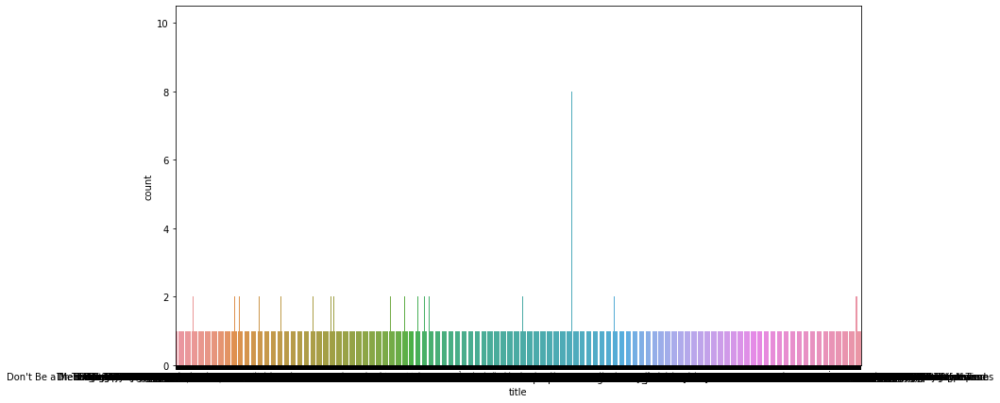

In [30]:
plt.figure(figsize=(13,7))
sns.countplot(x ='title', data = metadata4)

<AxesSubplot:xlabel='director', ylabel='count'>

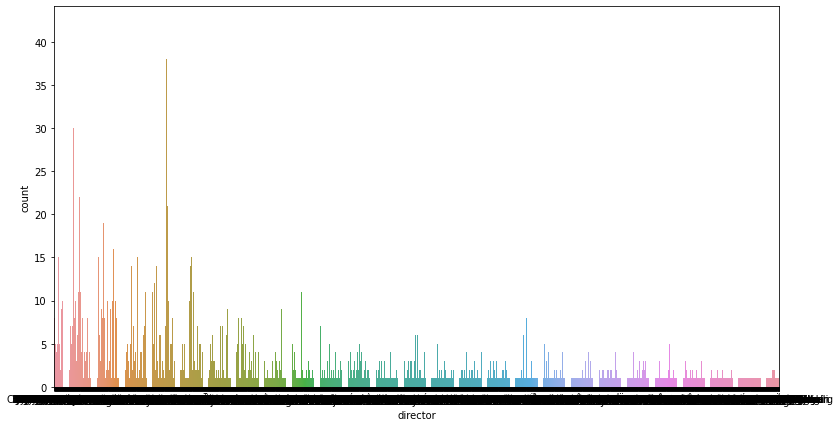

In [29]:
plt.figure(figsize=(13,7))
sns.countplot(x ='director', data = metadata4)

In [112]:
from math import sqrt
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

In [113]:
# Function to convert all strings to lower case and strip names of spaces
def clean_data(x):
    if isinstance(x, list):
        return [str.lower(i.replace(" ", "")) for i in x]
    else:
        #Check if director exists. If not, return empty string
        if isinstance(x, str):
            return str.lower(x.replace(" ", ""))
        else:
            return ''

In [114]:
# Apply clean_data function to your features.
features = ['cast', 'keywords', 'director', 'genres']

for feature in features:
    metadata[feature] = metadata[feature].apply(clean_data)

In [115]:
# The create_soup function will simply join all the required columns by a space. 
# This is the final preprocessing step, and the output of this function will be fed into the word vector model.
def create_soup(x):
    return ' '.join(x['keywords']) + ' ' + ' '.join(x['cast']) + ' ' + x['director'] + ' ' + ' '.join(x['genres'])

In [116]:
# Create a new soup feature
metadata['soup'] = metadata.apply(create_soup, axis=1)

In [117]:
metadata[['soup']].head(3)

,soup
0,jealousy toy boy tomhanks timallen donrickles ...
1,boardgame disappearance basedonchildren'sbook ...
2,fishing bestfriend duringcreditsstinger walter...


<AxesSubplot:xlabel='soup', ylabel='count'>

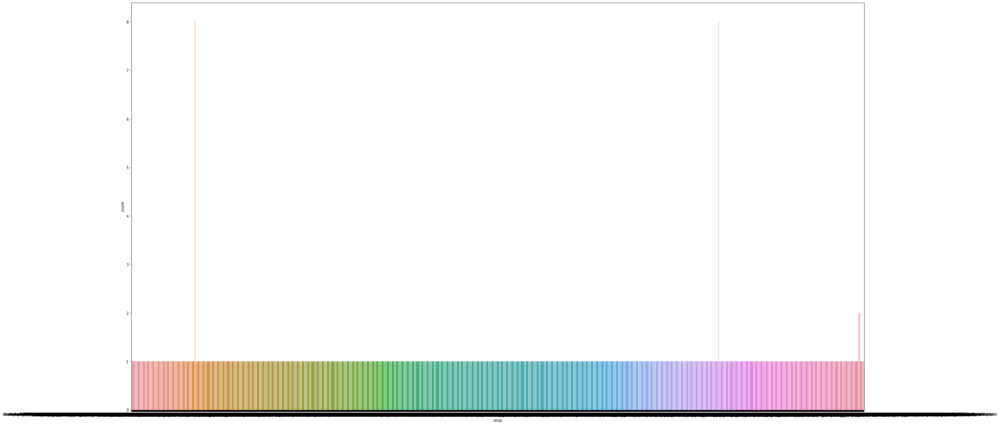

In [41]:
plt.figure(figsize=(35,20))
sns.countplot(x ='soup', data = metadata)

we will feed to the vectorizer( CountVectorizer() from skit-learn). it will convert the soup into a  vector matrix where each column represents a word. so that we can compute a similarity score with similarity metrics 

In [118]:
# Import CountVectorizer and create the count matrix
from sklearn.feature_extraction.text import CountVectorizer

count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(metadata['soup'])

In [119]:
count_matrix.shape

(9219, 18828)

we will be using the cosine similarity to measure the distance between the embeddings. we use the cosine similarity score since it is independent of magnitude and is relatively easy and fast to calculate

In [120]:
# Compute the Cosine Similarity matrix based on the count_matrix
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim2 = cosine_similarity(count_matrix, count_matrix)

In [121]:
# Reset index of your main DataFrame and construct reverse mapping as before
metadata = metadata.reset_index()
indices = pd.Series(metadata.index, index=metadata['title'])

In [122]:
# Function that takes in movie title as input and outputs most similar movies
def get_recommendations(title, cosine_sim2=cosine_sim2):
    # Get the index of the movie that matches the title
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim2[idx]))

    # Sort the movies list based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return metadata['title'].iloc[movie_indices]

In [123]:
get_recommendations('The Dark Knight Rises', cosine_sim2)

6981         The Dark Knight
6218           Batman Begins
6623            The Prestige
467        Romeo Is Bleeding
5904          State of Grace
6645             Harsh Times
7561             Harry Brown
4021    The Long Good Friday
217         The Glass Shield
2272             In Too Deep
Name: title, dtype: object

In [22]:
get_recommendations('The Godfather', cosine_sim2)

1602    The Godfather: Part III
994      The Godfather: Part II
5436                   Mitchell
981              Apocalypse Now
3300           Gardens of Stone
4148                The Gambler
904         Glengarry Glen Ross
1204              Donnie Brasco
1346              The Rainmaker
1524          On the Waterfront
Name: title, dtype: object

In [23]:
get_recommendations('Iron Man', cosine_sim2)

7600                      Iron Man 2
1682                            Tron
7764                    TRON: Legacy
7969                    The Avengers
8392                      Iron Man 3
8868         Avengers: Age of Ultron
8872      Captain America: Civil War
2969                         Starman
7122    20,000 Leagues Under the Sea
6359      Zathura: A Space Adventure
Name: title, dtype: object

In [49]:
r = get_recommendations('Tron', cosine_sim2)

In [50]:
r

62                     Lawnmower Man 2: Beyond Cyberspace
7009                                             Iron Man
7764                                         TRON: Legacy
2100                                             eXistenZ
2969                                              Starman
5256                          Babylon 5: In the Beginning
5292                            Babylon 5: A Call to Arms
5294                                Babylon 5: Thirdspace
2760    Teenage Mutant Ninja Turtles II: The Secret of...
4752                              Spy Kids 3-D: Game Over
Name: title, dtype: object

In [51]:
type(r)

pandas.core.series.Series

In [56]:
r.dtype

dtype('O')

In [48]:
get_recommendations('Tron', cosine_sim2)

62                     Lawnmower Man 2: Beyond Cyberspace
7009                                             Iron Man
7764                                         TRON: Legacy
2100                                             eXistenZ
2969                                              Starman
5256                          Babylon 5: In the Beginning
5292                            Babylon 5: A Call to Arms
5294                                Babylon 5: Thirdspace
2760    Teenage Mutant Ninja Turtles II: The Secret of...
4752                              Spy Kids 3-D: Game Over
Name: title, dtype: object